In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier
from imblearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

In [2]:
df = pd.read_csv('healthcare-dataset-stroke-data.csv')
df.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [3]:
# drop "id" column
df = df.drop('id', axis = 1)

In [4]:
df.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [5]:
df.describe()

,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke
count,5110.000000,5110.000000,5110.000000,5110.000000,4909.000000,5110.000000
mean,43.226614,0.097456,0.054012,106.147677,28.893237,0.048728
std,22.612647,0.296607,0.226063,45.283560,7.854067,0.215320
min,0.080000,0.000000,0.000000,55.120000,10.300000,0.000000
25%,25.000000,0.000000,0.000000,77.245000,23.500000,0.000000
50%,45.000000,0.000000,0.000000,91.885000,28.100000,0.000000
75%,61.000000,0.000000,0.000000,114.090000,33.100000,0.000000
max,82.000000,1.000000,1.000000,271.740000,97.600000,1.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   gender             5110 non-null   object 
 1   age                5110 non-null   float64
 2   hypertension       5110 non-null   int64  
 3   heart_disease      5110 non-null   int64  
 4   ever_married       5110 non-null   object 
 5   work_type          5110 non-null   object 
 6   Residence_type     5110 non-null   object 
 7   avg_glucose_level  5110 non-null   float64
 8   bmi                4909 non-null   float64
 9   smoking_status     5110 non-null   object 
 10  stroke             5110 non-null   int64  
dtypes: float64(3), int64(3), object(5)
memory usage: 439.3+ KB


In [7]:
# bmi column has null values
#fill the null values with the mean of the non-null values
df['bmi'].fillna(int(df['bmi'].mean()), inplace = True)

In [8]:
df.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,28.0,never smoked,1
2,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


In [9]:
#find the categories of the columns : gender, ever_married, work_type, Residence_type, smoking_status

In [10]:
df['gender'].unique()

array(['Male', 'Female', 'Other'], dtype=object)

In [11]:
df['ever_married'].unique()

array(['Yes', 'No'], dtype=object)

In [12]:
df['work_type'].unique()

array(['Private', 'Self-employed', 'Govt_job', 'children', 'Never_worked'],
      dtype=object)

In [13]:
df['Residence_type'].unique()

array(['Urban', 'Rural'], dtype=object)

In [14]:
df['smoking_status'].unique()

array(['formerly smoked', 'never smoked', 'smokes', 'Unknown'],
      dtype=object)

In [15]:
#replace all categories with numbers

In [16]:
df.ever_married.replace({'Yes':0, 'No':1}, inplace=True) 

In [17]:
df.work_type.replace({'Private':0, 'Self-employed':1, 'Govt_job':2, 'children':3, 'Never_worked':4}, inplace=True) 

In [18]:
df.Residence_type.replace({'Urban':0, 'Rural':1}, inplace=True)

In [19]:
df.smoking_status.replace({'formerly smoked':0, 'never smoked':1, 'smokes':2, 'Unknown':3}, inplace=True)

In [20]:
df.gender.replace({'Male':0, 'Female':1, 'Other':2}, inplace=True)
df.head(10)

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,0,67.0,0,1,0,0,0,228.69,36.6,0,1
1,1,61.0,0,0,0,1,1,202.21,28.0,1,1
2,0,80.0,0,1,0,0,1,105.92,32.5,1,1
3,1,49.0,0,0,0,0,0,171.23,34.4,2,1
4,1,79.0,1,0,0,1,1,174.12,24.0,1,1
5,0,81.0,0,0,0,0,0,186.21,29.0,0,1
6,0,74.0,1,1,0,0,1,70.09,27.4,1,1
7,1,69.0,0,0,1,0,0,94.39,22.8,1,1
8,1,59.0,0,0,0,0,1,76.15,28.0,3,1
9,1,78.0,0,0,0,0,0,58.57,24.2,3,1


In [21]:
#visualize the data

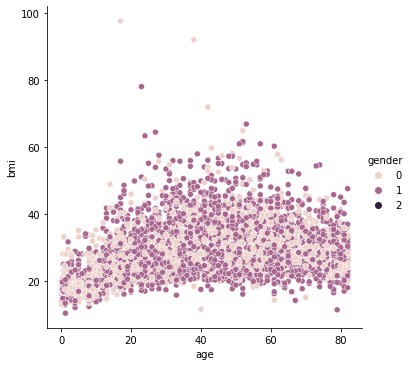

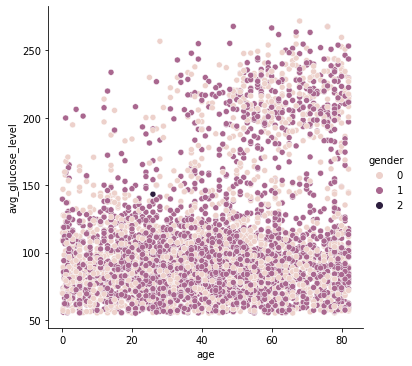

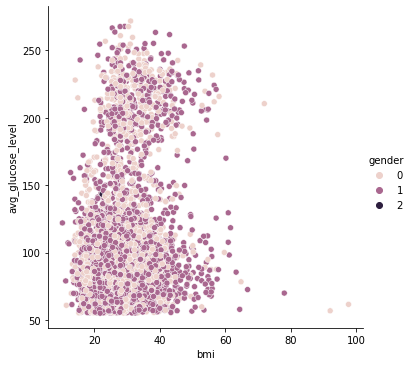

In [22]:
#scatter plots
sns.relplot(data=df, x="age", y="bmi",
    hue="gender",
    kind="scatter")

sns.relplot(data=df, x="age", y="avg_glucose_level",
    hue="gender",
    kind="scatter")

sns.relplot(data=df, x="bmi", y="avg_glucose_level",
     hue="gender",
    kind="scatter")

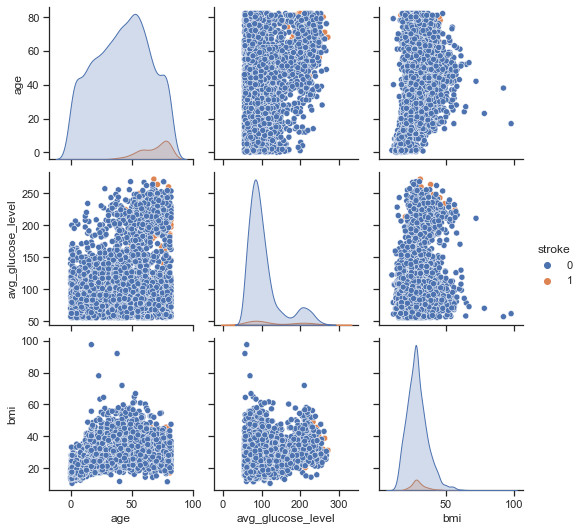

In [23]:
# diagonal plots: a univariate distribution plot is drawn to show the marginal distribution of the data in each column
# hue: name of variable in data to map plot aspects to different colors
df_1 = df[['age','avg_glucose_level','bmi','stroke']]
sns.set_theme(style="ticks")
sns.pairplot(df_1, hue="stroke")

Text(0.5, 1.0, 'Correlation Heatmap')

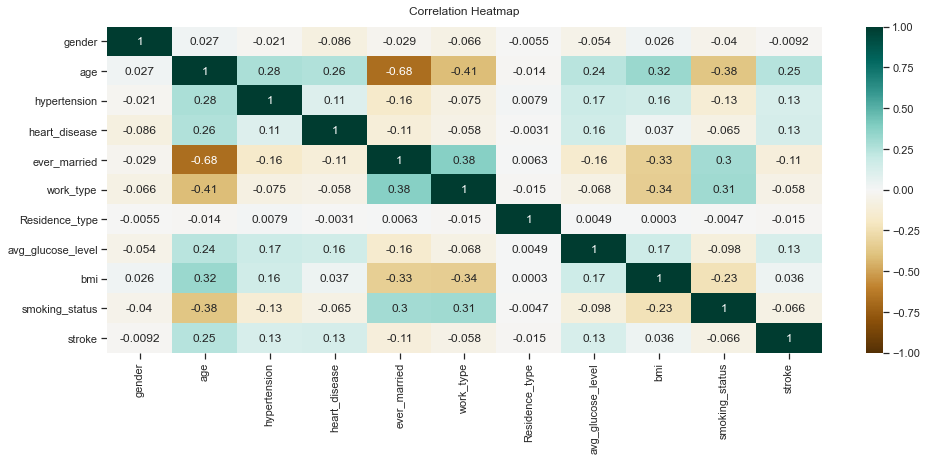

In [24]:
#correlation heat map
#Stronger correlation on both ends of the spectrum pops out in darker, weaker correlation in lighter shades.

plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(df.corr(), vmin=-1, vmax=1, annot = True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

In [25]:
df['gender'].value_counts()

1    2994
0    2115
2       1
Name: gender, dtype: int64

In [26]:
df['hypertension'].value_counts()

0    4612
1     498
Name: hypertension, dtype: int64

In [27]:
df['heart_disease'].value_counts()

0    4834
1     276
Name: heart_disease, dtype: int64

In [28]:
df['ever_married'].value_counts()

0    3353
1    1757
Name: ever_married, dtype: int64

In [29]:
df['work_type'].value_counts()

0    2925
1     819
3     687
2     657
4      22
Name: work_type, dtype: int64

In [30]:
df['Residence_type'].value_counts()

0    2596
1    2514
Name: Residence_type, dtype: int64

In [31]:
df['smoking_status'].value_counts()

1    1892
3    1544
0     885
2     789
Name: smoking_status, dtype: int64

In [32]:
df['stroke'].value_counts()

0    4861
1     249
Name: stroke, dtype: int64

In [33]:
df_crosstab = pd.crosstab(df['heart_disease'], df['stroke'], normalize='all')
df_crosstab

stroke,0,1
heart_disease,,
0,0.906458,0.039530
1,0.044814,0.009198


<AxesSubplot:xlabel='heart_disease'>

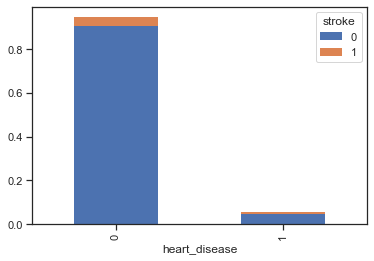

In [34]:
df_crosstab.plot.bar(stacked=True, linewidth=0.0)

In [35]:
df_crosstab = pd.crosstab(df['hypertension'], df['stroke'], normalize='all')
df_crosstab

stroke,0,1
hypertension,,
0,0.866732,0.035812
1,0.084540,0.012916


<AxesSubplot:xlabel='hypertension'>

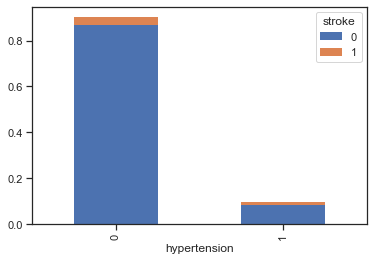

In [36]:
df_crosstab.plot.bar(stacked=True, linewidth=0.0)

In [37]:
df_crosstab = pd.crosstab(df['smoking_status'], df['stroke'], normalize='all')
df_crosstab

stroke,0,1
smoking_status,,
0,0.159491,0.013699
1,0.352642,0.017613
2,0.146184,0.008219
3,0.292955,0.009198


<AxesSubplot:xlabel='smoking_status'>

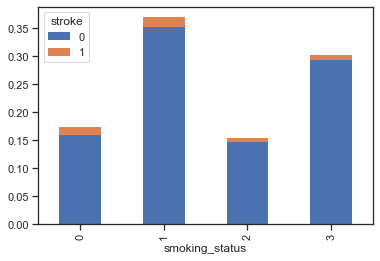

In [38]:
df_crosstab.plot.bar(stacked=True, linewidth=0.0)

<AxesSubplot:xlabel='stroke', ylabel='count'>

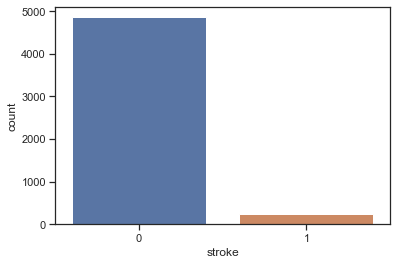

In [39]:
sns.countplot(x="stroke", data=df)

In [40]:
no_stroke = df[df['stroke'] == 0]
with_stroke = df[df['stroke'] == 1]

<AxesSubplot:ylabel='Frequency'>

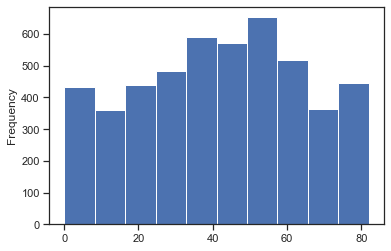

In [41]:
no_stroke.age.plot.hist()

<AxesSubplot:ylabel='Frequency'>

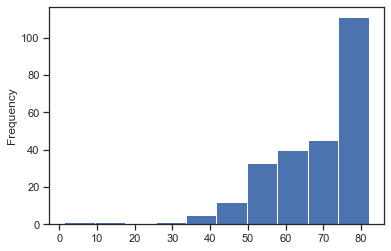

In [42]:
with_stroke.age.plot.hist()

In [43]:
#split the data: train & test
X = df.drop(['stroke'], 1)
y = df['stroke']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)


In [44]:
X_train.count()

gender               3423
age                  3423
hypertension         3423
heart_disease        3423
ever_married         3423
work_type            3423
Residence_type       3423
avg_glucose_level    3423
bmi                  3423
smoking_status       3423
dtype: int64

In [45]:
#dictionary of classifiers
classifiers = {
    "LogisiticRegression": LogisticRegression(random_state=0),
    "KNearest": KNeighborsClassifier(),
    "Support Vector Classifier": SVC(random_state=0),
    "DecisionTreeClassifier": DecisionTreeClassifier(random_state=0)
}

In [46]:
#the dataset is imbalanced
#OVERSAMPLING (kfold - smote)
#modelling
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)
smt = SMOTE(random_state=41)

for (train_index, test_index) in kfold.split(X_train, y_train):
   # select rows
   X_train = X.iloc[train_index]
   y_train = y[train_index]  
   X_test = X.iloc[test_index]
   y_test = y[test_index] 
   X_train_smt, y_train_smt = smt.fit_resample(X_train, y_train)
   for key, classifier in classifiers.items():
      classifier.fit(X_train_smt, y_train_smt)
      predictions = classifier.predict(X_test)
      score = classifier.score(X_test, y_test)
      cm = metrics.confusion_matrix(y_test, predictions) #true and predicted
      print(cm)
      print("Classifiers: ", classifier.__class__.__name__, "Has a training score of", round(score.mean(), 2) * 100, "% accuracy score")

c:\Users\User\Desktop\py-projects\env\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
[[500 126]
 [ 28  31]]
Classifiers:  LogisticRegression Has a training score of 78.0 % accuracy score
[[500 126]
 [ 21  38]]
Classifiers:  KNeighborsClassifier Has a training score of 79.0 % accuracy score
[[448 178]
 [ 11  48]]
Classifiers:  SVC Has a training score of 72.0 % accuracy score
[[550  76]
 [ 39  20]]
Classifiers:  DecisionTreeClassifier Has a training score of 83.0 % accuracy score
[[493 146]
 [ 22  24]]
Classifiers:  LogisticRegression Has a training sco

In [47]:
print('Length of X (train): {} | Length of y (train): {}'.format(len(X_train), len(y_train)))
print('Length of X (test): {} | Length of y (test): {}'.format(len(X_test), len(y_test)))

Length of X (train): 2739 | Length of y (train): 2739
Length of X (test): 684 | Length of y (test): 684


In [48]:
print('Length of X (train): {} | Length of y (train): {}'.format(len(X_train_smt), len(y_train_smt)))

Length of X (train): 5066 | Length of y (train): 5066


In [49]:
#dictionary of classifiers, their names, parameters and prefixes
grid_classifiers2 = [
    {
        "classifier": LogisticRegression(random_state=0),
        "name": "LogisticRegression",
        "params": {"lrn__penalty": ['l1', 'l2'], 'lrn__C': [0.001, 0.01,  0.1, 1, 10, 100, 1000]},
        "pref": "lrn"
    },
    {
        "classifier": KNeighborsClassifier(),
        "name": "KNearest",
        "params": {"knc__n_neighbors":  list(range(2,5,1)),'knc__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']},
        "pref": "knc"
    },
    {
        "classifier": SVC(random_state=0),
        "name": "Support Vector Classifier",
        "params": {'svc__C': [0.5, 0.7, 0.9, 1],
                'svc__kernel': ['rbf', 'poly', 'sigmoid', 'linear']}, 
        "pref": "svc"
    },
    {
        "classifier": DecisionTreeClassifier(random_state=0),
        "name": "DecisionTreeClassifier",
        "params": {"dtc__criterion": ["gini", "entropy"], "dtc__max_depth": list(range(2,4,1)),
              "dtc__min_samples_leaf": list(range(5,7,1))},
              "pref": "dtc"
    }
]

In [50]:
#modelling with GridSearch
for obj in grid_classifiers2:

    model = Pipeline([
                ('sampling', SMOTE(random_state=41)),
                (obj['pref'], obj['classifier'])
            ]) #(name,step)

    grid = GridSearchCV(model, obj['params'])
    grid.fit(X_train, y_train)

    grid_predictions = grid.predict(X_test)
    grid_score = grid.score(X_test, y_test)
    grid_best_estim = grid.best_estimator_ 
    grid_cm = metrics.confusion_matrix(y_test, grid_predictions)
    print(grid_best_estim)
    print(grid_cm)
    print("Classifiers: ", obj['name'], "Has a training score of", round(grid_score.mean(), 2) * 100, "% accuracy score")

NS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\User\Desktop\py-projects\env\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\User\Desktop\py-projects\env\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs fail

In [51]:
#All models have better scores after using GridSearch, with KNearest having the best score (85%). If I was to choose a model though, I would choose the DecisionTree model since it provides the best overall results.

In [52]:
X_1 = df.drop(['stroke'], 1)
y_1 = df['stroke']
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1 , y_1, test_size=0.33, random_state=42)

In [53]:
train_data = pd.concat([X_train_1, y_train_1], axis=1)
negative = train_data[train_data.stroke==0]
positive = train_data[train_data.stroke==1]
# negative['stroke'].value_counts()
positive['stroke'].value_counts()

1    153
Name: stroke, dtype: int64

In [54]:
y_test_1.value_counts()

0    1591
1      96
Name: stroke, dtype: int64

In [55]:
negative = negative.sample(frac=1)
negative = negative[:153]

In [56]:
undersample = pd.concat([positive,negative])

In [57]:
X_1_under_train =undersample.drop(['stroke'], 1)
y_1_under_train = undersample['stroke']

In [58]:
for key, classifier in classifiers.items():
    classifier.fit(X_1_under_train, y_1_under_train)
    predictions_under = classifier.predict(X_test_1)
    score_under = classifier.score(X_test_1, y_test_1)
    cm_under = metrics.confusion_matrix(y_test_1, predictions_under)
    print("Classifiers: ", classifier.__class__.__name__, "Has a training score of", round(score_under.mean(), 2) * 100, "% accuracy score")
    print(cm_under)

c:\Users\User\Desktop\py-projects\env\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
Classifiers:  LogisticRegression Has a training score of 73.0 % accuracy score
[[1146  445]
 [  18   78]]
Classifiers:  KNeighborsClassifier Has a training score of 71.0 % accuracy score
[[1125  466]
 [  23   73]]
Classifiers:  SVC Has a training score of 71.0 % accuracy score
[[1120  471]
 [  18   78]]
Classifiers:  DecisionTreeClassifier Has a training score of 69.0 % accuracy score
[[1096  495]
 [  30   66]]


In [59]:
grid_classifiers3 = [
    {
        "classifier": LogisticRegression(random_state=0),
        "name": "LogisticRegression",
        "params": {"penalty": ['l1', 'l2'], 'C': [0.001, 0.01,  0.1, 1, 10, 100, 1000]},
        
    },
    {
        "classifier": KNeighborsClassifier(),
        "name": "KNearest",
        "params": {"n_neighbors": list(range(2,5,1)),'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']},
      
    },
    {
        "classifier": SVC(random_state=0),
        "name": "Support Vector Classifier",
        "params": {'C': [0.5, 0.7, 0.9, 1],
                'kernel': ['rbf', 'poly', 'sigmoid', 'linear']}, 
        
    },
    {
        "classifier": DecisionTreeClassifier(random_state=0),
        "name": "DecisionTreeClassifier",
        "params": {"criterion": ["gini", "entropy"], "max_depth": list(range(2,4,1)),
              "min_samples_leaf": list(range(5,7,1))},
             
    }
]

In [60]:
for obj in grid_classifiers3:
    grid_under = GridSearchCV(obj['classifier'], obj['params'])
    grid_under.fit(X_1_under_train, y_1_under_train)

    grid_predictions_under = grid_under.predict(X_test_1)
    grid_score_under = grid_under.score(X_test_1, y_test_1)
    grid_best_estim_under = grid_under.best_estimator_ 
    grid_cm_under = metrics.confusion_matrix(y_test_1, grid_predictions_under)
    print(grid_best_estim_under)
    print(grid_cm_under)
    print("Classifiers: ", obj['name'], "Has a training score of", round(grid_score_under.mean(), 2) * 100, "% accuracy score")

meters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\Users\User\Desktop\py-projects\env\lib\site-packages\sklearn\model_selection\_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\User\Desktop\py-projects\env\lib\site-packages\sklearn\linear_model\_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "c:\Users\User\Desktop\py-projects\env\lib\site-packages\sklearn\linear_model\_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  warnings.warn("Estimator fit failed. The score on this train-test"
c:\Users\User\Desktop\py-projects\env\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the

In [61]:
#Overall, it is noticed that with GridSearch we get higher training scores. 
# Comparing oversampling and undersampling, by applying oversampling the training scores are better. 
# The performance of the classifiers, when we apply oversampling is not that good (see confusion matrices). With undersampling the performance is much better.